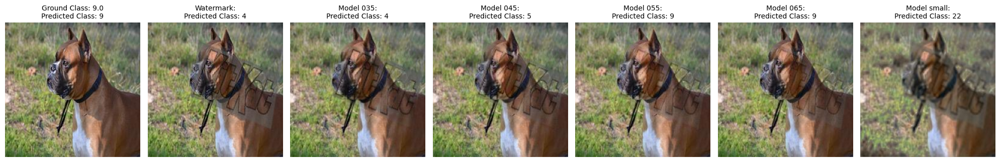

In [127]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import cv2

# Model name
model_name = "tiny_vit_5m_224"

# Common parts of the names
folder_base = "./data/images_cleaned_" # folder names might be adjusted to get the correct images
csv_base = "./data/reconstructed_comparison"
image_name = "boxer_83.jpg"
image_name_no_ext = os.path.splitext(image_name)[0]  # Remove ".jpg"

# Define folder suffixes
folder_suffixes = ["035", "045", "055", "065", "small"]

# Initialize lists for images and subtitles
images = []
subtitles = []

def get_predicted_class(csv_path, image_name, image_name_no_ext):
    """Retrieve the predicted class for a given image from the CSV file."""
    if os.path.exists(csv_path):
        df = pd.read_csv(csv_path)

        # Ensure the first column contains the image name without ".jpg"
        if image_name_no_ext in df.iloc[:, 0].values:
            row = df[df.iloc[:, 0] == image_name_no_ext].iloc[0]
            predicted_class = row["predicted_class"] if "predicted_class" in df.columns else "Unknown"
            ground_truth = row["class"] if "class" in df.columns else "Unknown"
            return predicted_class, ground_truth
        else:
            print(f"Image name {image_name_no_ext} not found in {csv_path}")
            return "Not Found", "Not Found"
    else:
        print(f"CSV not found: {csv_path}")
        return "No CSV Available", "No CSV Available"

# ** Ground Truth and Watermark **

# Ground Truth Image
path = "./data/resized_images/test"
image_path = os.path.join(path, image_name)
if os.path.exists(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    images.append(image)
else:
    print(f"Image not found: {image_path}")

# Ground Truth CSV
path_csv = "./data/test_predictions_comparison.csv"
predicted_class, ground_truth = get_predicted_class(path_csv, image_name, image_name_no_ext)
subtitles.append(f"Ground Class: {ground_truth}\nPredicted Class: {predicted_class}")

# Watermark Image
path = "./data/images_with_logos_5x/test"
image_path = os.path.join(path, image_name)
if os.path.exists(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    images.append(image)
else:
    print(f"Image not found: {image_path}")

# Watermark CSV
path_csv = "./data/predictions_comparison.csv"
predicted_class, _ = get_predicted_class(path_csv, image_name, image_name_no_ext)
subtitles.append(f"Watermark:\nPredicted Class: {predicted_class}")

# ** Loop for Remove Watermark Models **
for suffix in folder_suffixes:
    folder_path = os.path.join(f"{folder_base}{suffix}/test")
    csv_path = os.path.join(f"{csv_base}_{model_name}_{suffix}.csv")

    # Read the image
    image_path = os.path.join(folder_path, image_name)
    if os.path.exists(image_path):
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        images.append(image)
    else:
        print(f"Image not found: {image_path}")

    # Read the CSV and get the correct row
    predicted_class, _ = get_predicted_class(csv_path, image_name, image_name_no_ext)
    subtitles.append(f"Model {suffix}:\nPredicted Class: {predicted_class}")

# ** Display images in a row **
fig, axes = plt.subplots(1, len(images), figsize=(20, 6))

for ax, img, subtitle in zip(axes, images, subtitles):
    ax.imshow(img)
    ax.set_title(subtitle, fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.savefig("comparison_of_images")
plt.show()

In [53]:
import torch
import timm
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
import os

In [54]:
model_name = "tiny_vit_5m_224"
model_save_path = f"models/tiny_vit_5m_224_2025-01-06_17-38.pth"

#model = timm.create_model("tiny_vit_5m_224", pretrained=True, num_classes=37)
model = timm.create_model(model_name, pretrained=True, num_classes=37)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

state_dict = torch.load(
    #"tiny_vit_5m_224_2025-01-06_17-38.pth", map_location=device, weights_only=True
    model_save_path, map_location=device, weights_only=True
)
print("About to load state dict...")
try:
    model.load_state_dict(state_dict, strict=False)
    print("State dict loaded successfully!")
except Exception as e:
    print(f"Error while loading state dict: {e}")

model = model.to(device)
_ = model.eval()

About to load state dict...
State dict loaded successfully!


In [55]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(        #mean=[0.485, 0.456, 0.406],
        mean = [0.4784, 0.4460, 0.39609],
        #std=[0.229, 0.224, 0.225]
        std = [0.2245, 0.2216, 0.2227] )
])

#image = Image.open(image_path)

In [56]:
def reshape_transform(tensor, height=14, width=14):
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))

    # Bring the channels to the first dimension,
    # like in CNNs.
    result = result.transpose(2, 3).transpose(1, 2)
    return result

In [66]:
cam = GradCAM(model=model, target_layers=[model.stages[-1].blocks[-1].local_conv])

In [107]:
def apply_gradcam(image_path):
    image = Image.open(image_path)
    input_tensor = transform(image).unsqueeze(0).to(device)
    
    
    
    target_class = int(np.argmax(model(input_tensor).cpu().detach().numpy())) #+1 # added 1
    #output = model(input_tensor)
    #probabilities = torch.nn.functional.softmax(output, dim=1)
    #target_class = int(torch.argmax(probabilities, dim=1).cpu().item())
    
    targets = [ClassifierOutputTarget(target_class)]
    grayscale_cam = cam(
        input_tensor=input_tensor, targets=targets, #aug_smooth=True,
        eigen_smooth=True
    )

    # Get the first image in the batch
    grayscale_cam = grayscale_cam[0, :]
    #grayscale_cam = cam(input_tensor=input_tensor, targets=targets, eigen_smooth=True)
    
    # Convert PIL Image to numpy array for visualization
    rgb_img = np.array(image.resize((224, 224))) / 255.0

    # Generate visualization
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    return rgb_img, visualization, target_class

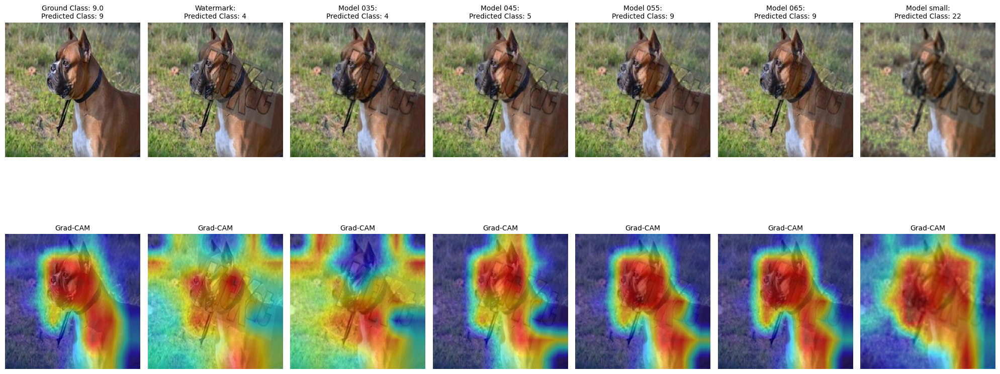

In [126]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import cv2


model_name = "tiny_vit_5m_224"


folder_base = "./data/images_cleaned_" # folder names might be adjusted to get the correct images
csv_base = "./data/reconstructed_comparison"
image_name = "boxer_83.jpg" #British_Shorthair_79, boxer_95, saint_bernard_45, boxer_83, wheaten_terrier_42    - scottish_terrier_2, leonberger_93
image_name_no_ext = os.path.splitext(image_name)[0]  # Remove ".jpg"

#folder suffixes
folder_suffixes = ["035", "045", "055", "065", "small"]


images = []
gradcam_images = []
subtitles = []

def get_predicted_class(csv_path, image_name, image_name_no_ext):
    """Retrieve the predicted class for a given image from the CSV file."""
    if os.path.exists(csv_path):
        df = pd.read_csv(csv_path)

        
        if image_name_no_ext in df.iloc[:, 0].values:
            row = df[df.iloc[:, 0] == image_name_no_ext].iloc[0]
            predicted_class = row["predicted_class"] if "predicted_class" in df.columns else "Unknown"
            ground_truth = row["class"] if "class" in df.columns else "Unknown"
            return predicted_class, ground_truth
        else:
            print(f"Image name {image_name_no_ext} not found in {csv_path}")
            return "Not Found", "Not Found"
    else:
        print(f"CSV not found: {csv_path}")
        return "No CSV Available", "No CSV Available"

# ** Ground Truth and Watermark **

# Ground Truth Image
path = "./data/resized_images/test"
image_path = os.path.join(path, image_name)
if os.path.exists(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    images.append(image)
    
    # Grad-CAM Processing
    original_img, cam_result, pred_class = apply_gradcam(image_path)
    gradcam_images.append(cam_result)
else:
    print(f"Image not found: {image_path}")

# Ground Truth CSV
path_csv = "./data/test_predictions_comparison.csv"
predicted_class, ground_truth = get_predicted_class(path_csv, image_name, image_name_no_ext)
subtitles.append(f"Ground Class: {ground_truth}\nPredicted Class: {predicted_class}")

# ** Watermark Image **
path = "./data/images_with_logos_5x/test"
image_path = os.path.join(path, image_name)
if os.path.exists(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    images.append(image)
    
    # Grad-CAM Processing
    original_img, cam_result, pred_class = apply_gradcam(image_path)
    gradcam_images.append(cam_result)
else:
    print(f"Image not found: {image_path}")

# Watermark CSV
path_csv = "./data/predictions_comparison.csv"
predicted_class, _ = get_predicted_class(path_csv, image_name, image_name_no_ext)
subtitles.append(f"Watermark:\nPredicted Class: {predicted_class}")

# ** Loop for Remove Watermark Models **
for suffix in folder_suffixes:
    folder_path = os.path.join(f"{folder_base}{suffix}/test")
    csv_path = os.path.join(f"{csv_base}_{model_name}_{suffix}.csv")

    # Read the image
    image_path = os.path.join(folder_path, image_name)
    if os.path.exists(image_path):
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        images.append(image)
        
        # Grad-CAM Processing
        original_img, cam_result, pred_class = apply_gradcam(image_path)
        gradcam_images.append(cam_result)
    else:
        print(f"Image not found: {image_path}")

    # Read the CSV and get the correct row
    predicted_class, _ = get_predicted_class(csv_path, image_name, image_name_no_ext)
    subtitles.append(f"Model {suffix}:\nPredicted Class: {predicted_class}")


fig, axes = plt.subplots(2, len(images), figsize=(20, 10))

for col_idx, (img, cam_img, subtitle) in enumerate(zip(images, gradcam_images, subtitles)):
    #Original Image
    axes[0, col_idx].imshow(img)
    axes[0, col_idx].set_title(subtitle, fontsize=10)
    axes[0, col_idx].axis("off")

    # Grad-CAM Heatmap
    if cam_img is not None:
        axes[1, col_idx].imshow(cam_img)
        axes[1, col_idx].set_title(f"Grad-CAM", fontsize=10)
        axes[1, col_idx].axis("off")
    else:
        axes[1, col_idx].axis("off")

plt.tight_layout()
plt.savefig("comparison_of_images_with_gradcam")
plt.show()



In [124]:
import pandas as pd

# Define file paths
original_path = "./data/test_predictions_comparison.csv"
watermark_path = "./data/predictions_comparison.csv"

# Load the data
original_df = pd.read_csv(original_path)
watermark_df = pd.read_csv(watermark_path)

# Ensure the 'name' column exists in both dataframes
if "image_name" in original_df.columns and "image_name" in watermark_df.columns:
    # Identify images that were originally classified correctly
    correctly_classified = original_df[original_df['class'] == original_df['predicted_class']]

    # Identify images that were misclassified with the watermark
    misclassified_with_watermark = watermark_df[watermark_df['class'] != watermark_df['predicted_class']]

    # Find images that were first classified correctly and then misclassified
    misclassified_names = correctly_classified.merge(
        misclassified_with_watermark, on="image_name", how="inner"
    )["image_name"].astype(str) + ".jpg"

    # Display the misclassified image names
    print(misclassified_names.tolist()[-375:-350])
    print(f"Number of misclassified images: {len(misclassified_names)}")
else:
    print("Column 'image_name' not found in one of the files. Please check the column headers.")


['Abyssinian_206.jpg', 'Abyssinian_212.jpg', 'Abyssinian_221.jpg', 'Abyssinian_223.jpg', 'Abyssinian_26.jpg', 'Abyssinian_36.jpg', 'Abyssinian_43.jpg', 'Abyssinian_48.jpg', 'Abyssinian_58.jpg', 'Abyssinian_62.jpg', 'Abyssinian_73.jpg', 'Abyssinian_90.jpg', 'Bengal_192.jpg', 'Bengal_201.jpg', 'Bengal_37.jpg', 'Bengal_88.jpg']
Number of misclassified images: 366


In [24]:
import os
import pandas as pd
import random
file_list = os.listdir("./data/resized_images/test")
random.shuffle(file_list)
print(file_list[:15])

['basset_hound_6.jpg', 'wheaten_terrier_42.jpg', 'japanese_chin_66.jpg', 'american_bulldog_67.jpg', 'Russian_Blue_89.jpg', 'japanese_chin_193.jpg', 'Bengal_195.jpg', 'samoyed_199.jpg', 'american_bulldog_211.jpg', 'great_pyrenees_92.jpg', 'Persian_79.jpg', 'basset_hound_29.jpg', 'basset_hound_62.jpg', 'american_bulldog_98.jpg', 'havanese_77.jpg']


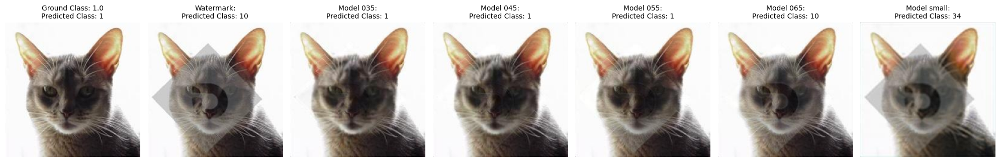

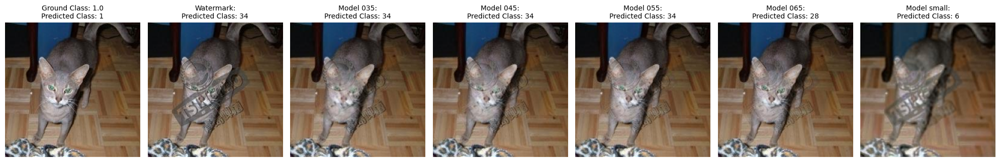

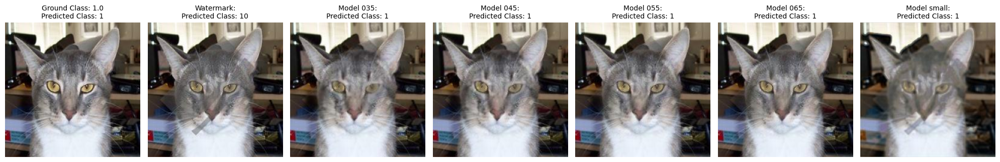

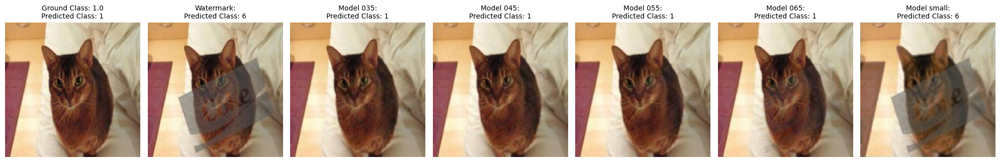

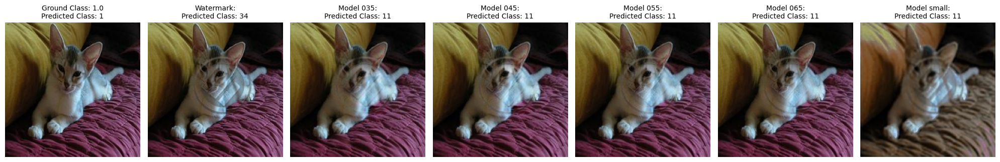

...

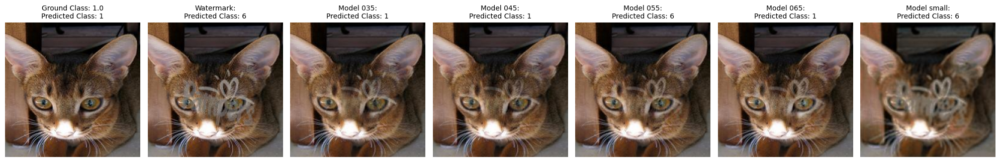

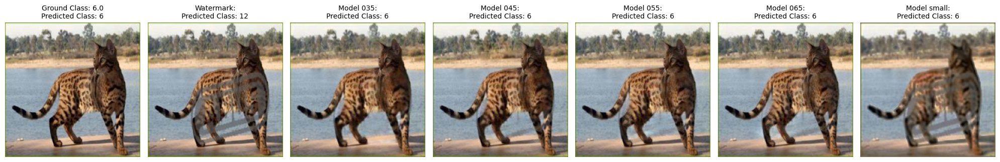

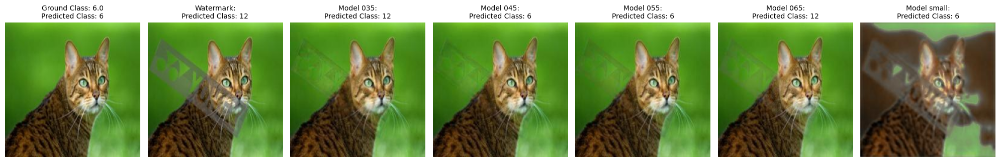

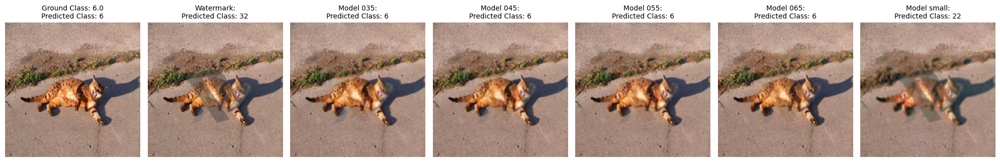

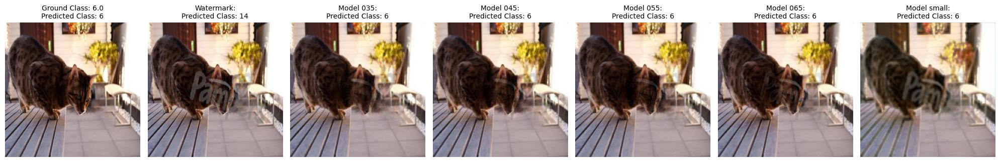

In [125]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import random

# Model name
model_name = "tiny_vit_5m_224"

# Common parts of the names
folder_base = "./data/images_cleaned_"
csv_base = "./data/reconstructed_comparison"

# Define folder suffixes
folder_suffixes = ["035", "045", "055", "065", "small"]

# List of available images (You can update this with your actual filenames)
available_images = [
'Abyssinian_206.jpg', 'Abyssinian_212.jpg', 'Abyssinian_221.jpg', 'Abyssinian_223.jpg', 'Abyssinian_26.jpg', 'Abyssinian_36.jpg', 'Abyssinian_43.jpg', 'Abyssinian_48.jpg', 'Abyssinian_58.jpg', 'Abyssinian_62.jpg', 'Abyssinian_73.jpg', 'Abyssinian_90.jpg', 'Bengal_192.jpg', 'Bengal_201.jpg', 'Bengal_37.jpg', 'Bengal_88.jpg'
]   
selected_images = available_images

# Initialize lists for all images and subtitles
all_images = []
all_subtitles = []

def get_predicted_class(csv_path, image_name, image_name_no_ext):
    """Retrieve the predicted class for a given image from the CSV file."""
    if os.path.exists(csv_path):
        df = pd.read_csv(csv_path)

        # Ensure the first column contains the image name without ".jpg"
        if image_name_no_ext in df.iloc[:, 0].values:
            row = df[df.iloc[:, 0] == image_name_no_ext].iloc[0]
            predicted_class = row["predicted_class"] if "predicted_class" in df.columns else "Unknown"
            ground_truth = row["class"] if "class" in df.columns else "Unknown"
            return predicted_class, ground_truth
        else:
            print(f"Image name {image_name_no_ext} not found in {csv_path}")
            return "Not Found", "Not Found"
    else:
        print(f"CSV not found: {csv_path}")
        return "No CSV Available", "No CSV Available"

# Loop through each selected image
for image_name in selected_images:
    image_name_no_ext = os.path.splitext(image_name)[0]  # Remove ".jpg"
    
    row_images = []
    row_subtitles = []

    # ** Ground Truth Image **
    path = "./data/resized_images/test"
    image_path = os.path.join(path, image_name)
    if os.path.exists(image_path):
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        row_images.append(image)
    else:
        print(f"Image not found: {image_path}")

    # Ground Truth CSV
    path_csv = "./data/test_predictions_comparison.csv"
    predicted_class, ground_truth = get_predicted_class(path_csv, image_name, image_name_no_ext)
    row_subtitles.append(f"Ground Class: {ground_truth}\nPredicted Class: {predicted_class}")

    # ** Watermark Image **
    path = "./data/images_with_logos_5x/test"
    image_path = os.path.join(path, image_name)
    if os.path.exists(image_path):
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        row_images.append(image)
    else:
        print(f"Image not found: {image_path}")

    # Watermark CSV
    path_csv = "./data/predictions_comparison.csv"
    predicted_class, _ = get_predicted_class(path_csv, image_name, image_name_no_ext)
    row_subtitles.append(f"Watermark:\nPredicted Class: {predicted_class}")

    # ** Loop for Remove Watermark Models **
    for suffix in folder_suffixes:
        folder_path = os.path.join(f"{folder_base}{suffix}/test")
        csv_path = os.path.join(f"{csv_base}_{model_name}_{suffix}.csv")

        # Read the image
        image_path = os.path.join(folder_path, image_name)
        if os.path.exists(image_path):
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            row_images.append(image)
        else:
            print(f"Image not found: {image_path}")

        # Read the CSV and get the correct row
        predicted_class, _ = get_predicted_class(csv_path, image_name, image_name_no_ext)
        row_subtitles.append(f"Model {suffix}:\nPredicted Class: {predicted_class}")

    # Append row data to global lists
    all_images.append(row_images)
    all_subtitles.append(row_subtitles)

# ** Display images in multiple rows **
#fig, axes = plt.subplots(len(selected_images), len(folder_suffixes) + 2, figsize=(20, 20))

# ** Display each image row in a separate plot **
for row_idx, (row_images, row_subtitles) in enumerate(zip(all_images, all_subtitles)):
    fig, axes = plt.subplots(1, len(row_images), figsize=(20, 6))  # New figure for each image row

    if len(row_images) == 1:  # If only one image, axes is not a list
        axes = [axes]

    for ax, img, subtitle in zip(axes, row_images, row_subtitles):
        ax.imshow(img)
        ax.set_title(subtitle, fontsize=10)
        ax.axis("off")

    plt.tight_layout()
    plt.show() 

#plt.tight_layout()
#plt.show()
